In [1]:
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

script_path = Path("../scripts").resolve()
if str(script_path) not in sys.path:
    sys.path.append(str(script_path))

from load_metrica import load_metrica_tracking

%matplotlib inline

In [69]:
tracking_home = pd.read_csv("../scripts/tracking_home_fixed.csv")
tracking_away = pd.read_csv("../scripts/tracking_away_fixed.csv")
events = pd.read_csv("../data/metrica-tracking-data/Sample_Game_1/Sample_Game_1_RawEventsData.csv")

print(f"Tracking frames: {tracking_home.shape[0]} frames")
print(f"Events: {events.shape[0]} rows")

Tracking frames: 145006 frames
Events: 1745 rows


In [60]:
def get_player_positions(tracking_df, frame, team_label):
    x_cols = [col for col in tracking_df.columns if col.startswith(team_label) and col.endswith('_x')]
    positions = {}
    for x_col in x_cols:
        pid = x_col[:-2]
        x = tracking_df.get(f"{pid}_x", pd.Series([np.nan]*len(tracking_df))).iloc[frame]
        y = tracking_df.get(f"{pid}_y", pd.Series([np.nan]*len(tracking_df))).iloc[frame]
        if not pd.isna(x) and not pd.isna(y):
            x_scaled = x* 105  # 105m pitch width
            y_scaled = y * 68     # 68m pitch height
            positions[pid] = (x_scaled, y_scaled)
    return positions

In [ ]:
def plot_team_shape(before_pos, after_pos, team_label):
    fig, ax = plt.subplots(figsize=(10, 7))

    # Draw pitch
    ax.set_xlim(0, 105)
    ax.set_ylim(0, 68)
    ax.set_facecolor("green")
    ax.plot([52.5, 52.5], [0, 68], color='white', linestyle='--')  # half line
    ax.plot([0, 0, 105, 105, 0], [0, 68, 68, 0, 0], color='white')  # outer box

    # Center circle
    center_circle = plt.Circle((52.5, 34), 9.15, color='white', fill=False)
    ax.add_patch(center_circle)

    # Player positions
    for pid, (bx, by) in before_pos.items():
        ax.plot(bx, by, 'o', color='blue')
        ax.annotate(pid.split('_')[-1], (bx, by), color='white', fontsize=8)

    for pid, (ax_, ay_) in after_pos.items():
        ax.plot(ax_, ay_, 'x', color='red')

    ax.set_title(f"Team {team_label} Shape Before vs After Pass")
    plt.tight_layout()
    plt.show()



Before: 11 players, After: 11 players


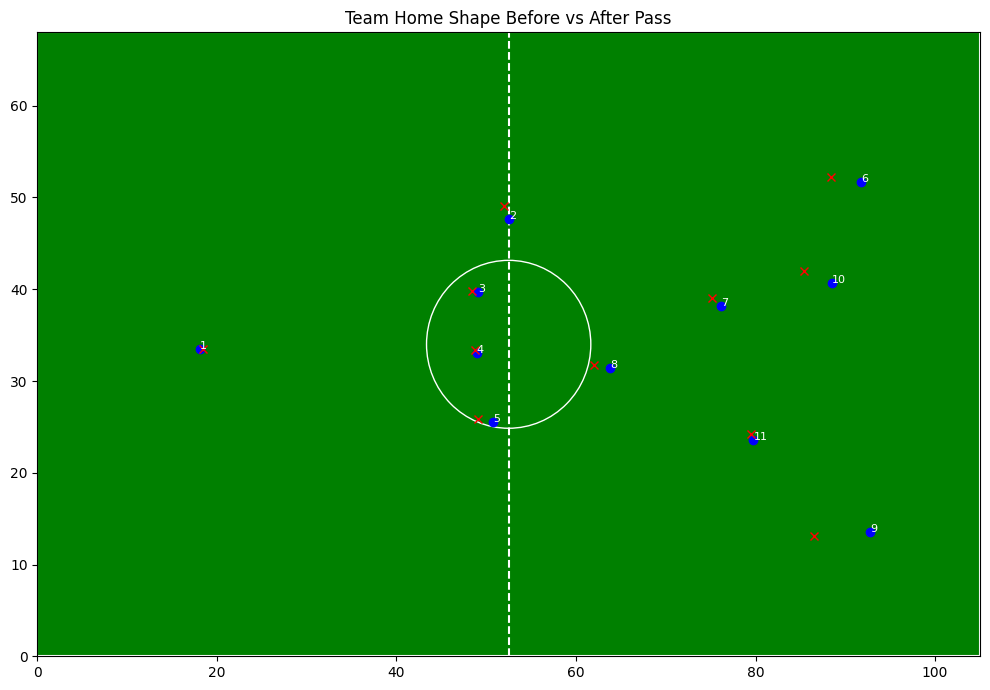

In [72]:
frame_before = 6128  # Choose a known valid frame
frame_after = frame_before + 50

home_before = get_player_positions(tracking_home, frame_before, "Home")
home_after = get_player_positions(tracking_home, frame_after, "Home")

print(f"Before: {len(home_before)} players, After: {len(home_after)} players")
plot_team_shape(home_before, home_after, "Home")



In [98]:
def plot_team_disruption(home_frame, away_before, away_after, passer_id=None):
    home_before = get_player_positions(tracking_home, home_frame, "Home")
    home_after = get_player_positions(tracking_home, home_frame + 50, "Home")

    fig, ax = plt.subplots(figsize=(10, 7))
    ax.set_xlim(0, 105)
    ax.set_ylim(0, 68)
    ax.set_facecolor("green")
    ax.plot([52.5, 52.5], [0, 68], color='white', linestyle='--')
    ax.plot([0, 0, 105, 105, 0], [0, 68, 68, 0, 0], color='white')
    ax.add_patch(plt.Circle((52.5, 34), 9.15, color='white', fill=False))

    # Plot Home team before (black circle) and after (gray x)
    for pid, (x, y) in home_before.items():
        if "Ball" in pid or pid.endswith("_0"): continue
        ax.plot(x, y, 'o', color='black')
        ax.annotate(pid.split('_')[-1], (x, y), color='white', fontsize=8)
    for pid, (x, y) in home_after.items():
        if "Ball" in pid or pid.endswith("_0"): continue
        ax.plot(x, y, 'x', color='gray')

    # Plot Away team before (white circle) and after (red x)
    for pid, (x, y) in away_before.items():
        if "Ball" in pid or pid.endswith("_0"): continue
        ax.plot(x, y, 'o', color='white')
        ax.annotate(pid.split('_')[-1], (x, y), color='black', fontsize=8)
    for pid, (x, y) in away_after.items():
        if "Ball" in pid or pid.endswith("_0"): continue
        ax.plot(x, y, 'x', color='red')

    # Plot ball if present
    for ball_pid in [pid for pid in home_before if "Ball" in pid or pid.endswith("_0")]:
        x, y = home_before[ball_pid]
        ax.plot(x, y, 'o', color='orange', markersize=8, label='Ball')
    for ball_pid in [pid for pid in home_after if "Ball" in pid or pid.endswith("_0")]:
        x, y = home_after[ball_pid]
        ax.plot(x, y, 'x', color='orange', markersize=8)

    # Highlight the passer (from Home team)
    if passer_id and f"{passer_id}_x" in tracking_home.columns:
        x = tracking_home.loc[home_frame, f"{passer_id}_x"] * 105
        y = tracking_home.loc[home_frame, f"{passer_id}_y"] * 68
        ax.plot(x, y, 'o', color='yellow', markersize=10)

    ax.set_title("Disruption After Home Pass – Home (black/gray), Away (white/red), Ball (orange)")
    plt.tight_layout()
    plt.show()



Before: 11 players, After: 11 players


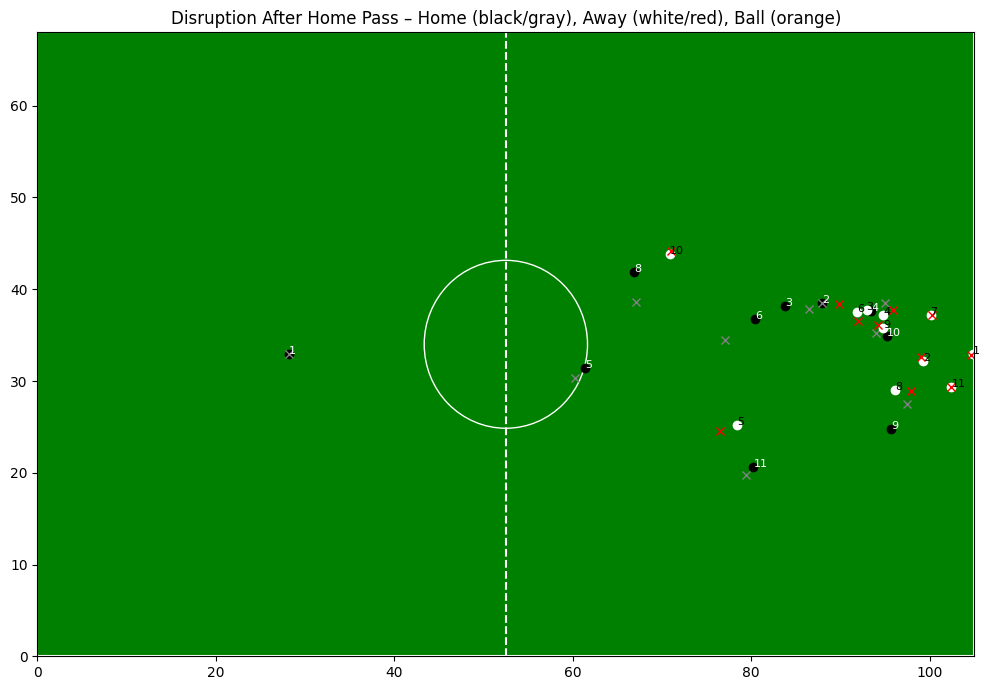

In [99]:
frame_before = 2000
frame_after = frame_before + 50

away_before = get_player_positions(tracking_away, frame_before, "Away")
away_after = get_player_positions(tracking_away, frame_after, "Away")
print(f"Before: {len(away_before)} players, After: {len(away_after)} players")
plot_team_disruption(frame_before, away_before, away_after)

In [101]:
def calculate_displacement(before, after):
    displacements = []
    for pid in before:
        x1, y1 = before[pid]
        x2, y2 = after.get(pid, (x1, y1))
        dist = np.sqrt((x2 - x1)**2 + (y2 - y1)**2)
        displacements.append(dist)
    return np.mean(displacements)

avg_displacement = calculate_displacement(away_before, away_after)
print(f"Average displacement of Away team: {avg_displacement:.2f} meters")


Average displacement of Away team: 0.98 meters


In [102]:
disruption_scores = []
passes = events[(events['Team'] == 'Home') & (events['Type'] == 'PASS')]

for _, row in passes.iterrows():
    try:
        frame = int(row['Start Frame'])

        # Measure how much the defending team (Away) moved
        before = get_player_positions(tracking_away, frame, "Away")
        after = get_player_positions(tracking_away, frame + 50, "Away")
        disruption = calculate_displacement(before, after)

        disruption_scores.append({
            "frame": frame,
            "player": row.get("From", "N/A"),
            "to": row.get("To", "N/A"),
            "disruption": disruption
        })
    except Exception:
        continue

disruption_df = pd.DataFrame(disruption_scores)
disruption_df = disruption_df.sort_values(by="disruption", ascending=False)
disruption_df.head(10)



,frame,player,to,disruption
58,27942,Player5,Player8,12.262261
4,1226,Player10,Player8,11.955147
268,102793,Player12,Player10,11.275910
11,5761,Player8,Player10,11.024464
379,128058,Player8,Player13,11.013598
255,91995,Player5,Player8,10.726177
385,130643,Player8,Player9,10.564008
157,61420,Player7,Player8,10.104695
13,9390,Player6,Player10,9.990609
25,15043,Player2,Player11,9.913896


Most disruptive frame: 27942 | From: Player5 → Player8
Disruption score (Away team): 12.26 meters


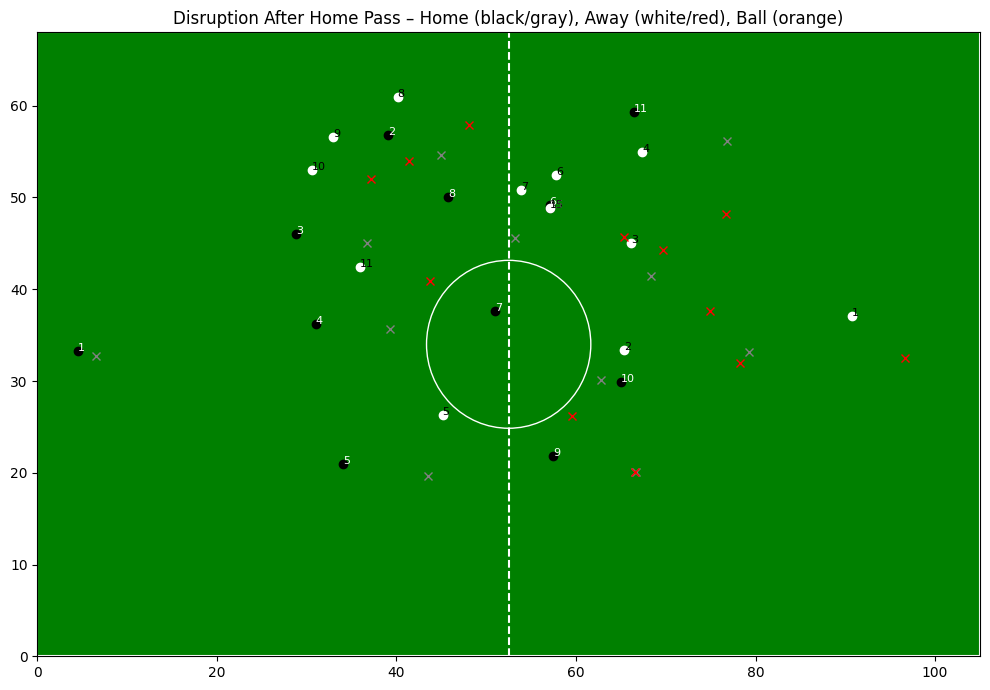

In [103]:
# Cell 8: Visualize the Most Disruptive Pass (Away Team Reaction)
best_frame = int(disruption_df.iloc[0]["frame"])
best_passer = disruption_df.iloc[0]["player"]
best_to = disruption_df.iloc[0]["to"]
best_score = disruption_df.iloc[0]["disruption"]

print(f"Most disruptive frame: {best_frame} | From: {best_passer} → {best_to}")
print(f"Disruption score (Away team): {best_score:.2f} meters")

away_before = get_player_positions(tracking_away, best_frame, "Away")
away_after = get_player_positions(tracking_away, best_frame + 50, "Away")

plot_team_disruption(best_frame, away_before, away_after, passer_id=best_passer)



In [158]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

def animate_disruption(start_frame, end_frame, interval=40):
    fig, ax = plt.subplots(figsize=(10, 7))
    ax.set_xlim(0, 105)
    ax.set_ylim(0, 68)
    ax.set_facecolor("green")
    ax.plot([52.5, 52.5], [0, 68], color='white', linestyle='--')
    ax.plot([0, 0, 105, 105, 0], [0, 68, 68, 0, 0], color='white')
    ax.add_patch(plt.Circle((52.5, 34), 9.15, color='white', fill=False))

    home_dots, = ax.plot([], [], 'o', color='black')
    away_dots, = ax.plot([], [], 'o', color='white')
    passer_dot, = ax.plot([], [], 'o', color='yellow', markersize=10)
    ball_dot, = ax.plot([], [], 'o', color='orange', markersize=6)


    def update(frame):
        home = get_player_positions(tracking_home, frame, "Home")
        away = get_player_positions(tracking_away, frame, "Away")

        hx, hy = zip(*home.values()) if home else ([], [])
        ax.set_title(f"Frame {frame}")
        home_dots.set_data(hx, hy)

        ax_, ay = zip(*away.values()) if away else ([], [])
        away_dots.set_data(ax_, ay)

        # Optional: highlight passer from disruption_df
        passer = disruption_df.iloc[0]["player"]
        if f"{passer}_x" in tracking_home.columns:
            px = tracking_home.loc[frame, f"{passer}_x"] * 105
            py = tracking_home.loc[frame, f"{passer}_y"] * 68
            passer_dot.set_data(px, py)
        else:
            passer_dot.set_data([], [])

        # Ball position
        ball_candidates = [pid for pid in tracking_home.columns if "Ball" in pid or pid.endswith("_0_x")]
        if ball_candidates:
            ball_x = tracking_home.loc[frame, ball_candidates[0]] * 105
            ball_y = tracking_home.loc[frame, ball_candidates[0].replace('_x', '_y')] * 68
            ball_dot.set_data(ball_x, ball_y)
        else:
            ball_dot.set_data([], [])


        return home_dots, away_dots, passer_dot, ball_dot


    ani = FuncAnimation(fig, update, frames=range(start_frame, end_frame), interval=interval, blit=True)
    plt.close()
    return ani


In [159]:
from IPython.display import HTML

HTML(ani.to_jshtml())

In [97]:
ani = animate_disruption(best_frame - 25, best_frame + 50)
ani.save("disruption_animation.gif", writer='pillow', fps=10)



In [109]:
def shape_variance(positions):
    xs, ys = zip(*positions.values())
    cx, cy = np.mean(xs), np.mean(ys)
    return np.mean([(x - cx)**2 + (y - cy)**2 for x, y in positions.values()])


In [110]:
for _, row in passes.iterrows():
    try:
        frame = int(row['Start Frame'])

        before = get_player_positions(tracking_away, frame, "Away")
        after = get_player_positions(tracking_away, frame + 50, "Away")

        disruption = calculate_displacement(before, after)
        pre_variance = shape_variance(before)
        post_variance = shape_variance(after)

        shape_change = post_variance - pre_variance

        disruption_scores.append({
            "frame": frame,
            "player": row.get("From", "N/A"),
            "to": row.get("To", "N/A"),
            "disruption": disruption,
            "shape_variance_before": pre_variance,
            "shape_variance_after": post_variance,
            "shape_variance_change": shape_change
        })
    except Exception:
        continue


In [111]:
disruption_df = pd.DataFrame(disruption_scores)
disruption_df = disruption_df.sort_values(by="shape_variance_change", ascending=False)


In [112]:
disruption_df[["frame", "player", "to", "disruption", "shape_variance_before", "shape_variance_after", "shape_variance_change"]].head(10)


,frame,player,to,disruption,shape_variance_before,shape_variance_after,shape_variance_change
784,121899,Player2,Player11,7.771030,423.556228,602.313125,178.756897
711,104252,Player2,Player11,7.473538,493.428996,631.906837,138.477842
853,136961,Player2,Player11,4.912367,498.556743,625.423212,126.866468
802,123556,Player3,Player11,8.627246,463.679939,572.454939,108.775000
578,59329,Player4,Player3,6.551308,430.095291,535.524668,105.429377
449,7041,Player3,Player4,6.467746,564.194651,668.838486,104.643835
515,42476,Player6,Player10,5.141799,249.079778,344.629522,95.549744
725,105477,Player2,Player7,7.197580,442.700933,523.335194,80.634261
646,79869,Player5,Player7,8.164536,404.351262,483.568024,79.216762
833,131850,Player5,Player7,4.233958,293.460244,371.969333,78.509089


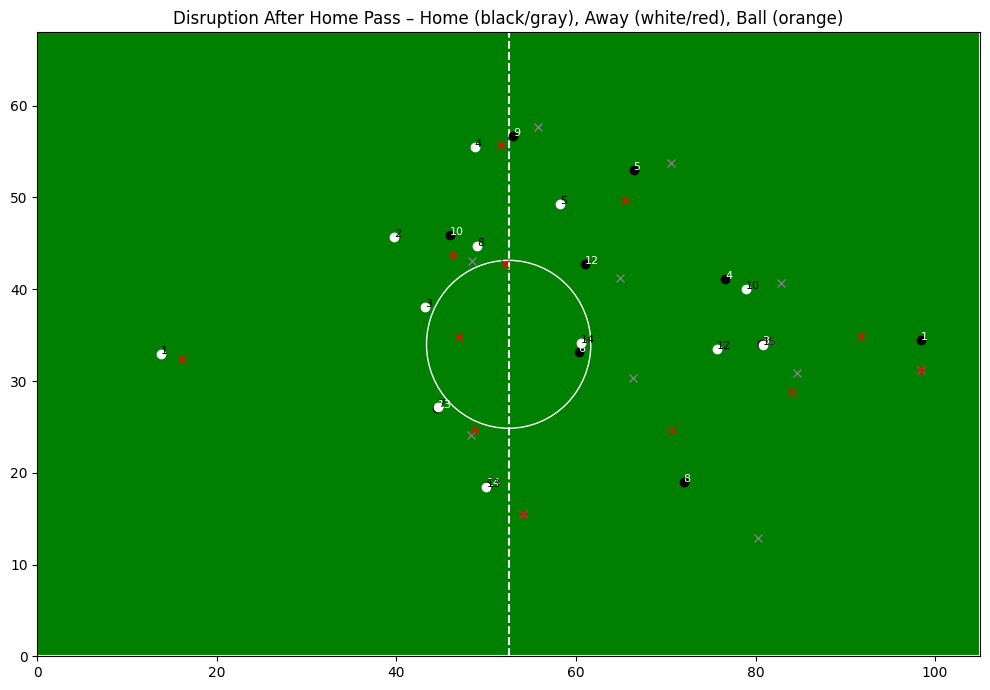

In [113]:
best_frame = int(disruption_df.iloc[0]["frame"])
best_passer = disruption_df.iloc[0]["player"]

away_before = get_player_positions(tracking_away, best_frame, "Away")
away_after = get_player_positions(tracking_away, best_frame + 50, "Away")

plot_team_disruption(best_frame, away_before, away_after, passer_id=best_passer)


In [114]:
print(f"Frame: {best_frame} | {best_passer} → {disruption_df.iloc[0]['to']}")
print(f"Disruption: {disruption_df.iloc[0]['disruption']:.2f} m")
print(f"Shape variance ↑ {disruption_df.iloc[0]['shape_variance_before']:.2f} → {disruption_df.iloc[0]['shape_variance_after']:.2f}")


Frame: 121899 | Player2 → Player11
Disruption: 7.77 m
Shape variance ↑ 423.56 → 602.31


In [115]:
top_disruption = disruption_df.sort_values(by="shape_variance_change", ascending=False).iloc[0]
top_frame = int(top_disruption["frame"])
top_passer = top_disruption["player"]
top_receiver = top_disruption["to"]


In [116]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def animate_disruption(start_frame, end_frame, passer_id=None, receiver_id=None):
    fig, ax = plt.subplots(figsize=(10, 7))
    ax.set_xlim(0, 105)
    ax.set_ylim(0, 68)
    ax.set_facecolor("green")
    ax.plot([52.5, 52.5], [0, 68], color='white', linestyle='--')
    ax.plot([0, 0, 105, 105, 0], [0, 68, 68, 0, 0], color='white')
    ax.add_patch(plt.Circle((52.5, 34), 9.15, color='white', fill=False))

    home_dots, = ax.plot([], [], 'o', color='black')
    away_dots, = ax.plot([], [], 'o', color='white')
    ball_dot, = ax.plot([], [], 'o', color='orange', markersize=6)
    passer_dot, = ax.plot([], [], 'o', color='yellow', markersize=10)
    receiver_dot, = ax.plot([], [], 'o', color='cyan', markersize=10)

    def update(frame):
        home = get_player_positions(tracking_home, frame, "Home")
        away = get_player_positions(tracking_away, frame, "Away")

        hx, hy = zip(*[(x, y) for pid, (x, y) in home.items() if "Ball" not in pid and not pid.endswith("_0")])
        ax_, ay = zip(*[(x, y) for pid, (x, y) in away.items() if "Ball" not in pid and not pid.endswith("_0")])
        home_dots.set_data(hx, hy)
        away_dots.set_data(ax_, ay)

        # ball
        for pid in home:
            if "Ball" in pid or pid.endswith("_0"):
                x, y = home[pid]
                ball_dot.set_data(x, y)

        # passer
        if passer_id and f"{passer_id}_x" in tracking_home.columns:
            px = tracking_home.loc[frame, f"{passer_id}_x"] * 105
            py = tracking_home.loc[frame, f"{passer_id}_y"] * 68
            passer_dot.set_data(px, py)

        # receiver (optional highlight)
        if receiver_id and f"{receiver_id}_x" in tracking_home.columns:
            rx = tracking_home.loc[frame, f"{receiver_id}_x"] * 105
            ry = tracking_home.loc[frame, f"{receiver_id}_y"] * 68
            receiver_dot.set_data(rx, ry)

        ax.set_title(f"Frame {frame}")
        return home_dots, away_dots, ball_dot, passer_dot, receiver_dot

    ani = FuncAnimation(fig, update, frames=range(start_frame, end_frame), interval=50, blit=True)
    plt.close()
    return ani


In [117]:
ani2 = animate_disruption(top_frame - 25, top_frame + 50, passer_id=top_passer, receiver_id=top_receiver)
HTML(ani2.to_jshtml())


In [143]:
disruption_scores = []
passes = events[(events['Team'] == 'Home') & (events['Type'] == 'PASS')]

for _, row in passes.iterrows():
    try:
        frame = int(row['Start Frame'])

        before = get_player_positions(tracking_away, frame + 10, "Away")
        after = get_player_positions(tracking_away, frame + 60, "Away")
        disruption = calculate_displacement(before, after)
        pre_var = shape_variance(before)
        post_var = shape_variance(after)
        shape_delta = post_var - pre_var

        # Ball movement estimate (Home_0 = ball, or "Ball" in name)
        ball_id = [pid for pid in tracking_home.columns if "0_x" in pid or "Ball_x" in pid]
        if ball_id:
            bx0 = tracking_home.loc[frame, ball_id[0]] * 105
            bx1 = tracking_home.loc[frame + 5, ball_id[0]] * 105
            ball_dx = bx1 - bx0
        else:
            ball_dx = 0

        disruption_scores.append({
            "frame": frame,
            "player": row.get("From", "N/A"),
            "to": row.get("To", "N/A"),
            "disruption": disruption,
            "shape_variance_before": pre_var,
            "shape_variance_after": post_var,
            "shape_variance_change": shape_delta,
            "ball_dx": ball_dx
        })

    except Exception:
        continue

disruption_df = pd.DataFrame(disruption_scores)


In [144]:
true_disruptions = disruption_df[
    (disruption_df["disruption"] > 1) &
    (disruption_df["shape_variance_before"] < 400) &
    (disruption_df["shape_variance_change"] > 0.01) &
    (disruption_df["ball_dx"] > 1)  # ball moved forward >10m
].sort_values(by="shape_variance_change", ascending=False)



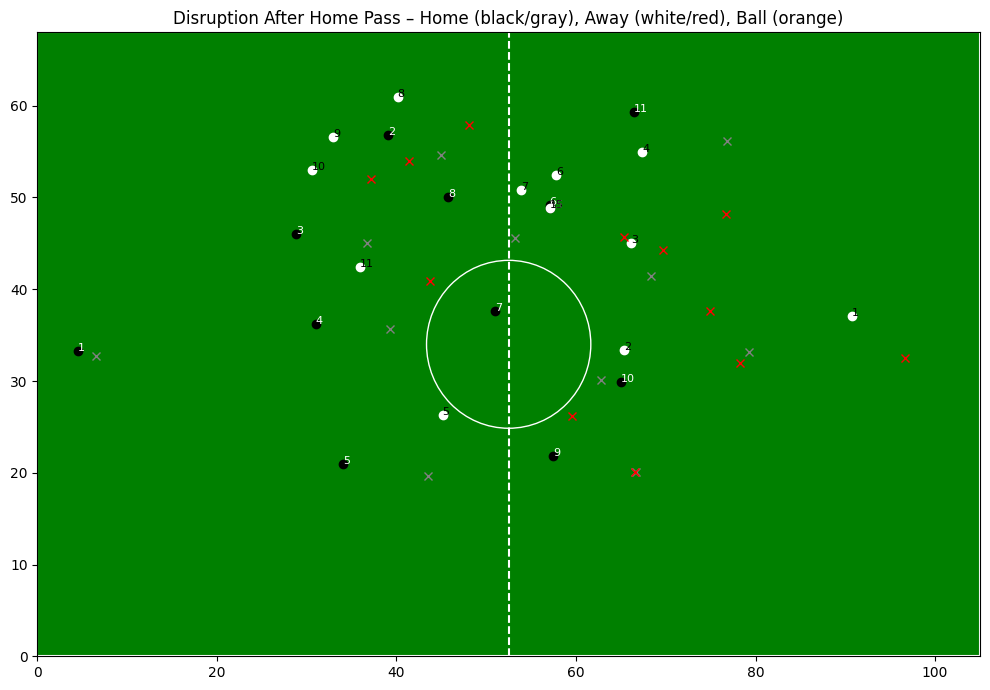

In [145]:
top_clean = true_disruptions.iloc[0]
frame = int(top_clean["frame"])
plot_team_disruption(frame,
                     get_player_positions(tracking_away, frame, "Away"),
                     get_player_positions(tracking_away, frame + 50, "Away"),
                     passer_id=top_clean["player"])



In [146]:
ani_clean = animate_disruption(frame - 25, frame + 50,
                               passer_id=top_clean["player"],
                               receiver_id=top_clean["to"])
HTML(ani_clean.to_jshtml())



In [151]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def animate_full_game(start=0, end=3000, step=5):
    fig, ax = plt.subplots(figsize=(10, 7))
    ax.set_xlim(0, 105)
    ax.set_ylim(0, 68)
    ax.set_facecolor("green")
    ax.plot([52.5, 52.5], [0, 68], color='white', linestyle='--')
    ax.plot([0, 0, 105, 105, 0], [0, 68, 68, 0, 0], color='white')
    ax.add_patch(plt.Circle((52.5, 34), 9.15, color='white', fill=False))

    home_dots, = ax.plot([], [], 'o', color='red')
    away_dots, = ax.plot([], [], 'o', color='blue')
    ball_dot, = ax.plot([], [], 'o', color='white', markersize=6)

    def update(frame):
        home = get_player_positions(tracking_home, frame, "Home")
        away = get_player_positions(tracking_away, frame, "Away")

        hx, hy = zip(*[(x, y) for pid, (x, y) in home.items() if "Ball" not in pid and not pid.endswith("_0")])
        ax_, ay = zip(*[(x, y) for pid, (x, y) in away.items() if "Ball" not in pid and not pid.endswith("_0")])
        home_dots.set_data(hx, hy)
        away_dots.set_data(ax_, ay)

        # Ball
        for pid in home:
            if "Ball" in pid or pid.endswith("_0"):
                x, y = home[pid]
                ball_dot.set_data(x, y)

        ax.set_title(f"Frame {frame}")
        return home_dots, away_dots, ball_dot

    ani = FuncAnimation(fig, update, frames=range(start, end, step), interval=40, blit=True)
    plt.close()
    return ani


In [157]:
ani_full = animate_full_game(start=62500, end=63500)
HTML(ani_full.to_jshtml())
